In [1]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

espirales = ('..\\..\\Data\\Images\\fpC-003804-41-2-0120-0093.jpg', '..\\..\\Data\\Images\\fpC-002206-40-1-0079-0128.jpg', '..\\..\\Data\\Images\\fpC-003927-40-4-0012-0258.jpg', '..\\..\\Data\\Images\\fpC-001739-40-3-0070-0290.jpg' )
elipticas = ('..\\..\\Data\\Images\\fpC-003818-41-6-0383-0086.jpg', '..\\..\\Data\\Images\\fpC-003031-40-5-0299-0194.jpg', '..\\..\\Data\\Images\\fpC-003225-40-4-0071-0021.jpg', '..\\..\\Data\\Images\\fpC-001045-40-6-0061-0025.jpg' )
S0s = ('..\\..\\Data\\Images\\fpC-003818-41-3-0195-0004.jpg', '..\\..\\Data\\Images\\fpC-001350-40-3-0168-0169.jpg', '..\\..\\Data\\Images\\fpC-001043-40-6-0115-0133.jpg', '..\\..\\Data\\Images\\fpC-002830-41-4-0249-0005.jpg' )
IrrMisc = ('..\\..\\Data\\Images\\fpC-002738-40-1-0229-0126.jpg', '..\\..\\Data\\Images\\fpC-003712-40-6-0045-0038.jpg', '..\\..\\Data\\Images\\fpC-002304-41-2-0170-0052.jpg', '..\\..\\Data\\Images\\fpC-002777-40-4-0187-0077.jpg' )

In [2]:
folder_path = 'C:\\Users\\maseo\\OneDrive\\Escritorio\\GalaxyClassification\\Data\\Images'
filename = 'fpC-000752-40-6-0474-0050.jpg'
img_path = os.path.join(folder_path, filename)
img = cv2.imread(img_path)

In [30]:
kernel = np.ones((5,5),np.uint8)
kernel2 = np.array([[-1,-1,-1], [-1,11,-1], [-1,-1,-1]])
(h, w) = img.shape[:2]
(cX, cY) = (w // 2, h // 2)
M = cv2.getRotationMatrix2D((cX, cY), 15, 1.0)
alto, ancho = img.shape[:2]
shear_x = 0.15  # Cantidad de cizallamiento en el eje X
shear_y = 0.13  # Cantidad de cizallamiento en el eje Y
M_shear = np.float32([[1, shear_x, 0], [shear_y, 1, 0]])
scale_x = 0.5  # Factor de escala en el eje X
scale_y = 0.38  # Factor de escala en el eje Y
traslacion_x = 50  # Traslación en el eje X
traslacion_y = 30  # Traslación en el eje Y
M_traslacion = np.float32([[1, 0, traslacion_x], [0, 1, traslacion_y]])
img_blurred = np.copy(img)
ruido = np.zeros_like(img, dtype=np.uint8)
cv2.randn(ruido, mean=0, stddev=50)

# Definir el tamaño objetivo
nuevo_ancho = 100
nuevo_alto = 100

# Obtener el tamaño original de la imagen
alto_original, ancho_original = img.shape[:2]

# Calcular los factores de escala para el redimensionamiento
factor_escala_x = nuevo_ancho / ancho_original
factor_escala_y = nuevo_alto / alto_original

# Aplicamos las técnicas de modificación para crear nuevas imágenes
flipped_img = cv2.flip(img, 1)
rotated_img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
img_blurred[:, :, 0] = cv2.GaussianBlur(img[:, :, 0], (5, 5), 0)  # Canal R
img_blurred[:, :, 1] = cv2.GaussianBlur(img[:, :, 1], (5, 5), 0)  # Canal G
img_blurred[:, :, 2] = cv2.GaussianBlur(img[:, :, 2], (5, 5), 0)  # Canal B
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
color_img = cv2.convertScaleAbs(img, alpha=4, beta=0)
dilation = cv2.dilate(img,kernel,iterations = 1)
enfocada = cv2.filter2D(img, -1, kernel2)
image = cv2.warpAffine(img, M, (w, h))
shear = cv2.warpAffine(img, M_shear, (ancho, alto))
escala = cv2.resize(img, None, fx=factor_escala_x, fy=factor_escala_y, interpolation=cv2.INTER_LINEAR)
traslacion = cv2.warpAffine(img, M_traslacion, (ancho, alto))
img_noisy = cv2.add(img, ruido)

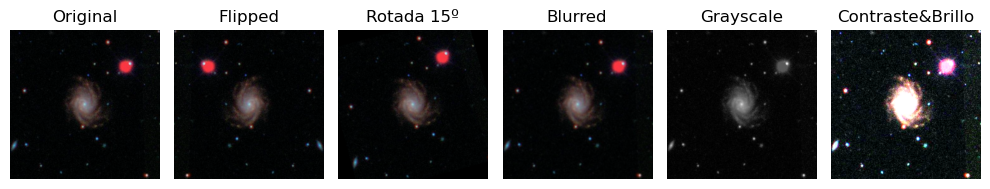

In [31]:
# Mostramos las imágenes en subplots
fig, axs = plt.subplots(1, 6, figsize=(10,40))
# Mostramos la imagen original en la primera columna
axs[0].imshow(img)
axs[0].set_title('Original')
axs[0].axis('off')

axs[1].imshow(flipped_img)
axs[1].set_title('Flipped')
axs[1].axis('off')

axs[2].imshow(image)
axs[2].set_title('Rotada 15º')
axs[2].axis('off')

axs[3].imshow(img_blurred)
axs[3].set_title('Blurred')
axs[3].axis('off')

axs[4].imshow(gray_img, cmap='gray')
axs[4].set_title('Grayscale')
axs[4].axis('off')

axs[5].imshow(color_img)
axs[5].set_title('Contraste&Brillo')
axs[5].axis('off')

plt.tight_layout()
plt.show()

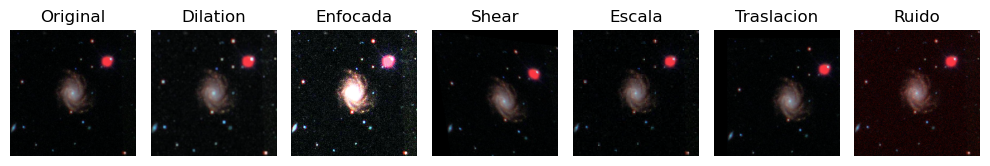

In [17]:
# Mostramos las imágenes en subplots
fig, axs = plt.subplots(1, 7, figsize=(10,40))
# Mostramos la imagen original en la primera columna
axs[0].imshow(img)
axs[0].set_title('Original')
axs[0].axis('off')

axs[1].imshow(dilation)
axs[1].set_title('Dilation')
axs[1].axis('off')

axs[2].imshow(enfocada)
axs[2].set_title('Enfocada')
axs[2].axis('off')

axs[3].imshow(shear)
axs[3].set_title('Shear')
axs[3].axis('off')

axs[4].imshow(escala)
axs[4].set_title('Escala')
axs[4].axis('off')

axs[5].imshow(traslacion)
axs[5].set_title('Traslacion')
axs[5].axis('off')

axs[6].imshow(img_noisy)
axs[6].set_title('Ruido')
axs[6].axis('off')

plt.tight_layout()
plt.show()

Ahora es cuestión de encontrar los límites de estas transformaciones.
Vamos a ver las configuraciones más agresivas de cada transformación para deducir el límite de integridad de la transformación.
La idea es transformar pero no deformar. La información debe seguir siendo 'legible'.

Hay ciertas transformaciones que no tienen límite. 
- Flipped: El espejo vertical u horizontal NO afecta en nada a la información de la imágen.
- Rotación: Cualquier ángulo de rotación mantiene la información intacta.
- Grayscale: La transformación a grises no debería suponer ningún problema.

Comenzaré por Blurr Gaussiano
-
- (5, 5) especifica el tamaño del kernel gaussiano. El último parámetro, que en este caso se establece en 0, representa la desviación estándar a lo largo de x e y del kernel gaussiano. Si se establece en 0, OpenCV automáticamente calcula la desviación estándar según el tamaño del kernel.
- Este blurr se puede aplicar a cada capa RGB.
- img_blurred[:, :, 0] | img_blurred[:, :, 1] | img_blurred[:, :, 2]

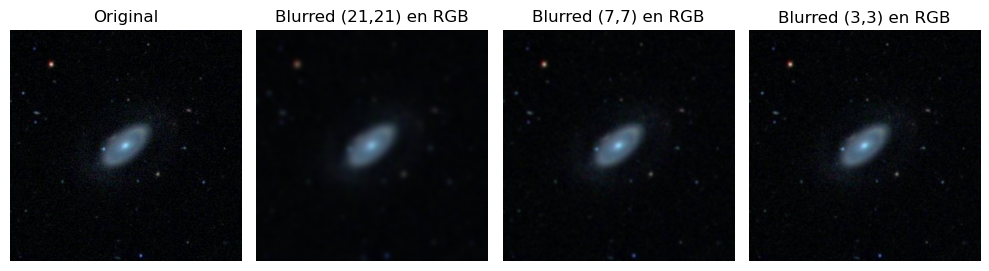

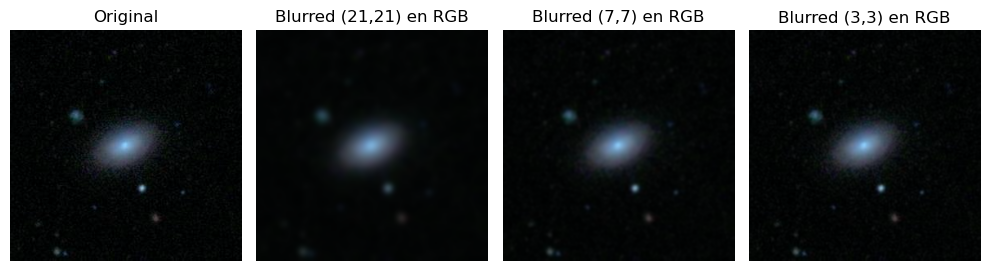

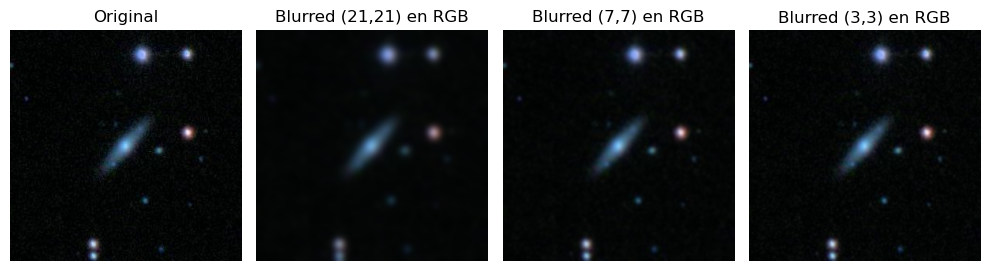

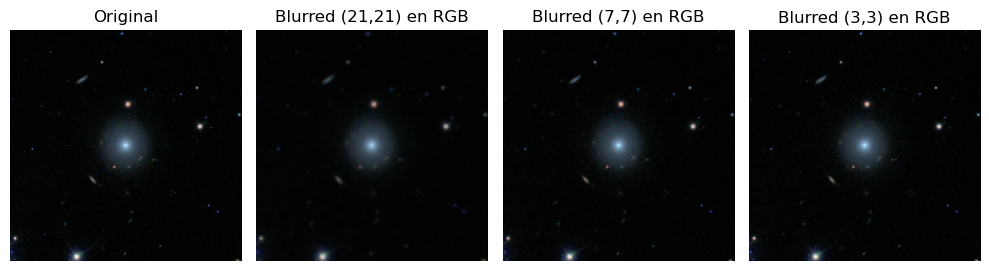

In [222]:
for img in S0s:
    img = cv2.imread(img)
    img_blurred = np.copy(img)
    img_blurred1 = np.copy(img)
    img_blurred2 = np.copy(img)
    
    img_blurred[:, :, 0] = cv2.GaussianBlur(img[:, :, 0], (21,21), 0)  # Canal R
    img_blurred[:, :, 1] = cv2.GaussianBlur(img[:, :, 1], (21,21), 0)  # Canal G
    img_blurred[:, :, 2] = cv2.GaussianBlur(img[:, :, 2], (21,21), 0)  # Canal B
    
    img_blurred1[:, :, 0] = cv2.GaussianBlur(img[:, :, 0], (7,7), 0)  # Canal R
    img_blurred1[:, :, 1] = cv2.GaussianBlur(img[:, :, 1], (7,7), 0)  # Canal G
    img_blurred1[:, :, 2] = cv2.GaussianBlur(img[:, :, 2], (7,7), 0)  # Canal B
    
    img_blurred2[:, :, 0] = cv2.GaussianBlur(img[:, :, 0], (3,3), 0)  # Canal R
    img_blurred2[:, :, 1] = cv2.GaussianBlur(img[:, :, 1], (3,3), 0)  # Canal G
    img_blurred2[:, :, 2] = cv2.GaussianBlur(img[:, :, 2], (3,3), 0)  # Canal B
    
    fig, axs = plt.subplots(1, 4, figsize=(10,40))
    # Mostramos la imagen original en la primera columna
    axs[0].imshow(img)
    axs[0].set_title('Original')
    axs[0].axis('off')
    
    axs[1].imshow(img_blurred)
    axs[1].set_title('Blurred (21,21) en RGB')
    axs[1].axis('off')
    
    axs[2].imshow(img_blurred1)
    axs[2].set_title('Blurred (7,7) en RGB')
    axs[2].axis('off')
    
    axs[3].imshow(img_blurred2)
    axs[3].set_title('Blurred (3,3) en RGB')
    axs[3].axis('off')
    
    plt.tight_layout()
    plt.show()

La siguiente es Dilation.
-
- Tiene como parámetro un kernel de 1 y 0, que lo que hace es dilater en el eje x y en el eje y
- Lo ideal para mantener la información es hacer dilataciones cuadradas

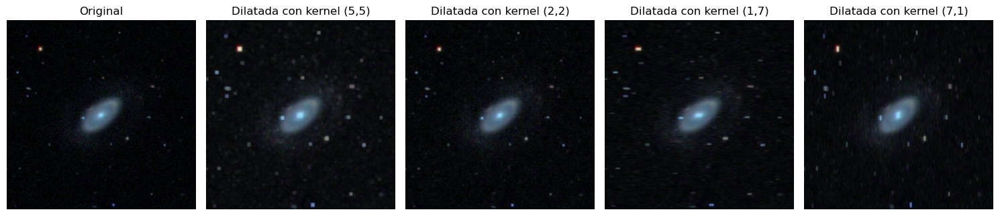

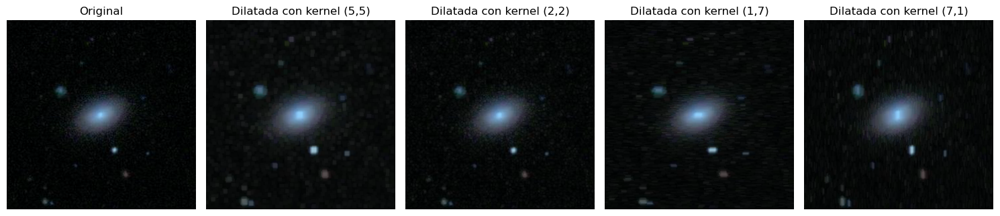

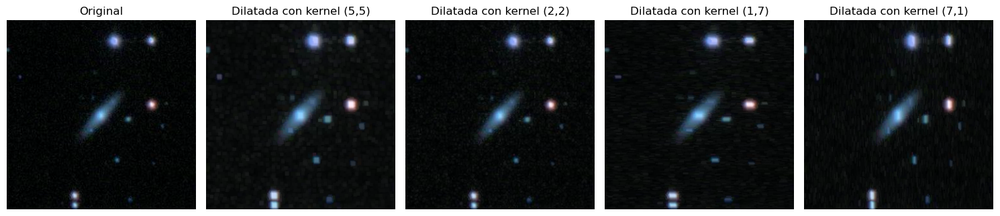

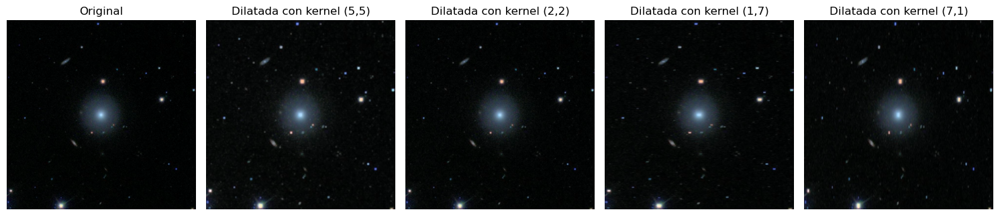

In [223]:
for img in S0s:
    img = cv2.imread(img)
    kernel = np.ones((5,5),np.uint8)
    kernel1 = np.ones((2,2),np.uint8)
    kernel2 = np.ones((1,7),np.uint8)
    kernel3 = np.ones((7,1),np.uint8)
    
    dilation = cv2.dilate(img,kernel,iterations = 1)
    dilation1 = cv2.dilate(img,kernel1,iterations = 1)
    dilation2 = cv2.dilate(img,kernel2,iterations = 1)
    dilation3 = cv2.dilate(img,kernel3,iterations = 1)
    fig, axs = plt.subplots(1, 5, figsize=(15,40))
    # Mostramos la imagen original en la primera columna
    axs[0].imshow(img)
    axs[0].set_title('Original')
    axs[0].axis('off')
    
    axs[1].imshow(dilation)
    axs[1].set_title('Dilatada con kernel (5,5)')
    axs[1].axis('off')
    
    axs[2].imshow(dilation1)
    axs[2].set_title('Dilatada con kernel (2,2)')
    axs[2].axis('off')
    
    axs[3].imshow(dilation2)
    axs[3].set_title('Dilatada con kernel (1,7)')
    axs[3].axis('off')
    
    axs[4].imshow(dilation3)
    axs[4].set_title('Dilatada con kernel (7,1)')
    axs[4].axis('off')
    
    plt.tight_layout()
    plt.show()

Enfoque:
-
- Realiza una operación de convolución 2D en una imagen. A diferencia de las operaciones morfológicas como la dilatación o la erosión, que utilizan un kernel predefinido para realizar transformaciones específicas en la imagen, cv2.filter2D() permite aplicar cualquier kernel de convolución personalizado a una imagen.

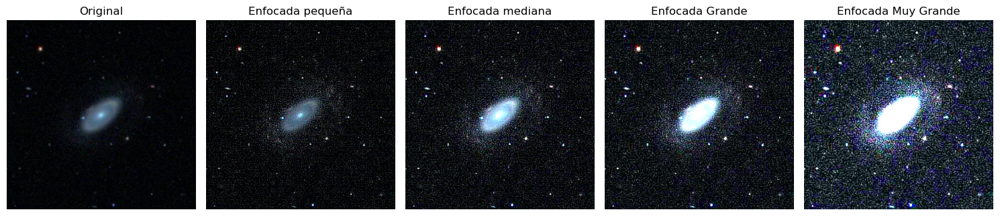

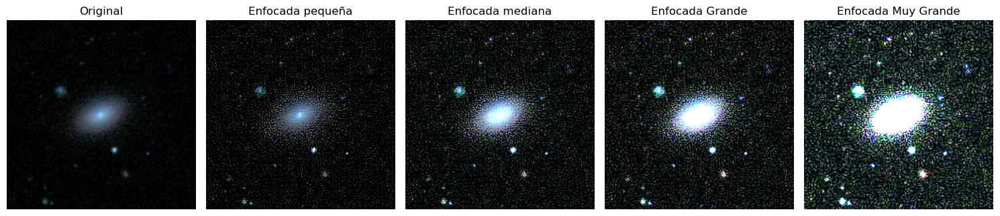

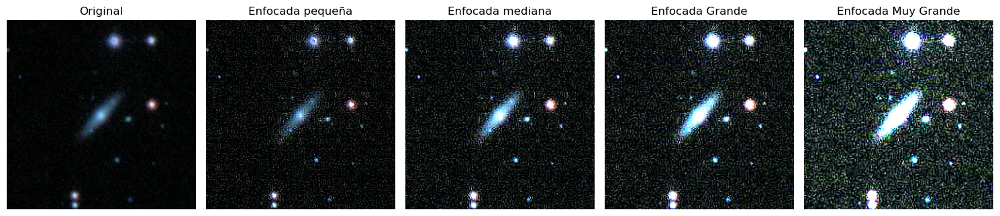

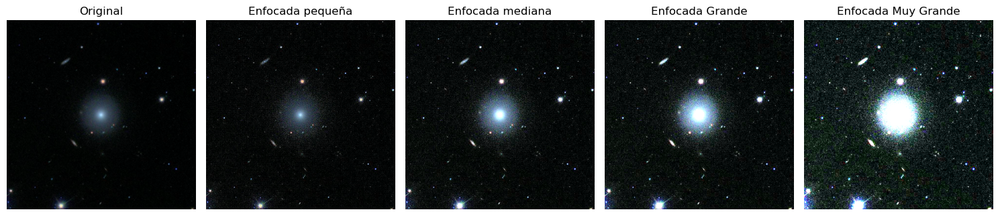

In [224]:
for img in S0s:
    img = cv2.imread(img)

    # El valor central de los kernel es FLOAT
    
    kernel_p = np.array([[-1,-1,-1], [-1,15,-1], [-1,-1,-1]])
    kernel_mediano = np.array([[-1,-1,-1], [-1,11,-1], [-1,-1,-1]]) 
    kernel_grande = np.array([[-1,-1,-1], [-1,10,-1], [-1,-1,-1]])
    kernel_muygrande = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
    
    
    enfocada_suav = cv2.filter2D(img, -1, kernel_mediano)
    enfocada_lap = cv2.filter2D(img, -1, kernel_grande)
    enfocada_k = cv2.filter2D(img, -1, kernel_muygrande)
    enfocada_p = cv2.filter2D(img, -1, kernel_p)
    
    fig, axs = plt.subplots(1, 5, figsize=(15,40))
    # Mostramos la imagen original en la primera columna
    axs[0].imshow(img)
    axs[0].set_title('Original')
    axs[0].axis('off')
    
    axs[3].imshow(enfocada_suav)
    axs[3].set_title('Enfocada Grande')
    axs[3].axis('off')
    
    axs[2].imshow(enfocada_lap)
    axs[2].set_title('Enfocada mediana')
    axs[2].axis('off')
    
    axs[1].imshow(enfocada_k)
    axs[1].set_title('Enfocada pequeña')
    axs[1].axis('off')
    
    axs[4].imshow(enfocada_p)
    axs[4].set_title('Enfocada Muy Grande')
    axs[4].axis('off')
    
    plt.tight_layout()
    plt.show()

Shear
-
- La función cv2.warpAffine() en OpenCV se utiliza para aplicar una transformación de afinidad a una imagen. En particular, cuando se utiliza para el efecto de "shear" (cizallamiento), puede deformar la imagen aplicando un desplazamiento uniforme a las coordenadas x o y de todos los puntos de la imagen. Esto crea una especie de distorsión en la dirección especificada.
- M: La matriz de transformación de afinidad que define la operación de shear.

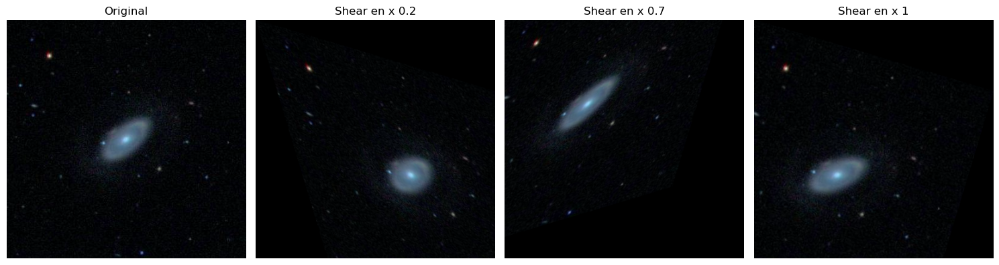

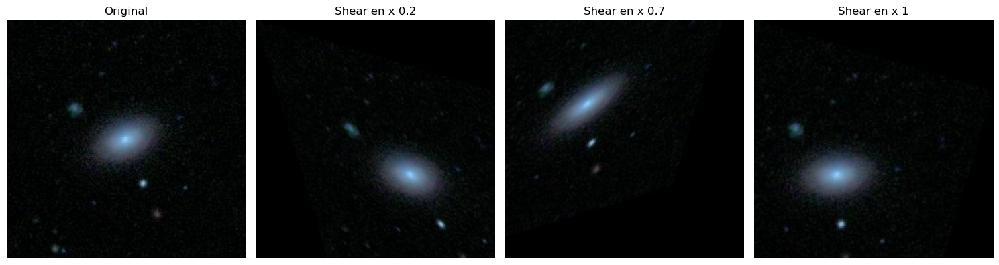

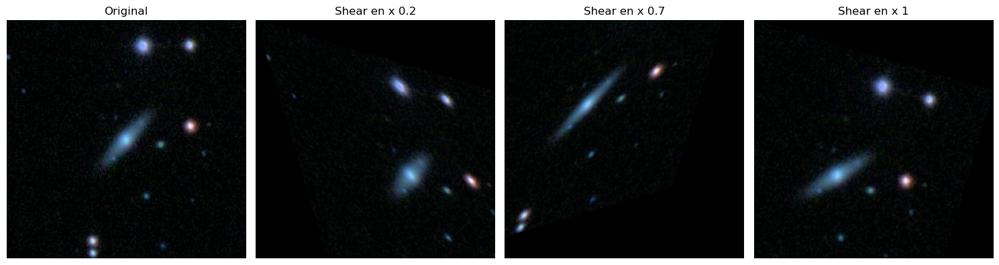

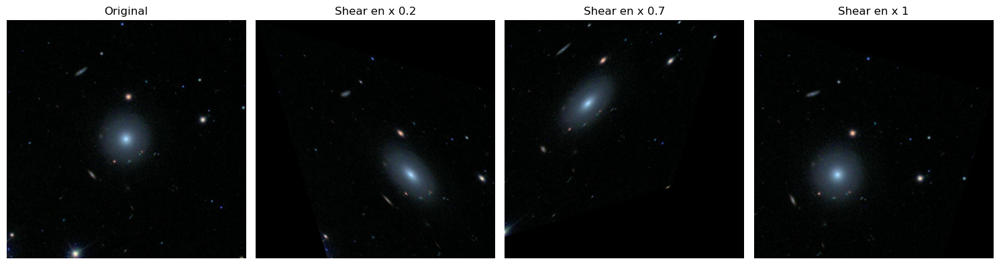

In [225]:
for img in S0s:
    img = cv2.imread(img)

    alto, ancho = img.shape[:2]
    
    # PARECE QUE LO IDEAL ES PONER ELEMENTOS DE LA DIAGONAL = 1 Y EL RESTO ENTRE [-0.3,0.3]
    
    M = np.float32([[1, 0.3, 0],   # No hay cambio en x, un cizallamiento de 0.5 en y
                  [0.3, 1, 0]])    # No hay cambio en z
    
    M1 = np.float32([[1, -0.3, 0],   # No hay cambio en x, un cizallamiento de 0.5 en y
                    [-0.3, 1, 0]])    # No hay cambio en z
    
    M2 = np.float32([[1, -0.3, 0],   # No hay cambio en x, un cizallamiento de 0.5 en y
                    [+0.3, 1, 0]])    # No hay cambio en z
    
    # Aplicar el cizallamiento a la imagen
    shear = cv2.warpAffine(img, M, (ancho, alto))
    shear1 = cv2.warpAffine(img, M1, (ancho, alto))
    shear2 = cv2.warpAffine(img, M2, (ancho, alto))
    
    fig, axs = plt.subplots(1, 4, figsize=(15,40))
    # Mostramos la imagen original en la primera columna
    axs[0].imshow(img)
    axs[0].set_title('Original')
    axs[0].axis('off')
    
    axs[1].imshow(shear)
    axs[1].set_title('Shear en x 0.2')
    axs[1].axis('off')
    
    axs[2].imshow(shear1)
    axs[2].set_title('Shear en x 0.7')
    axs[2].axis('off')
    
    axs[3].imshow(shear2)
    axs[3].set_title('Shear en x 1')
    axs[3].axis('off')
    
    
    
    plt.tight_layout()
    plt.show()

Traslación
-
- La función cv2.warpAffine() se utiliza en OpenCV para aplicar transformaciones de afinidad a una imagen, como traslación, rotación, escalado, etc.n.

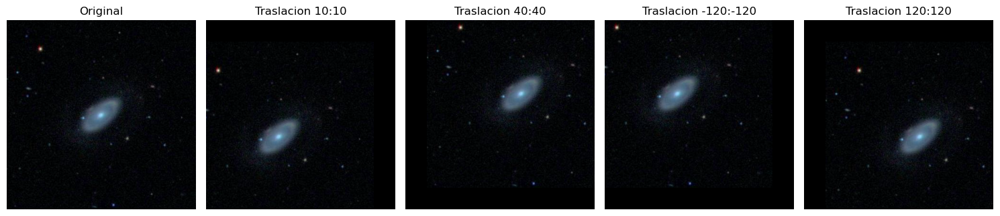

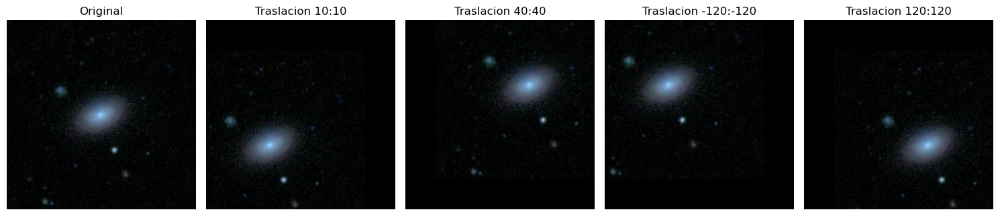

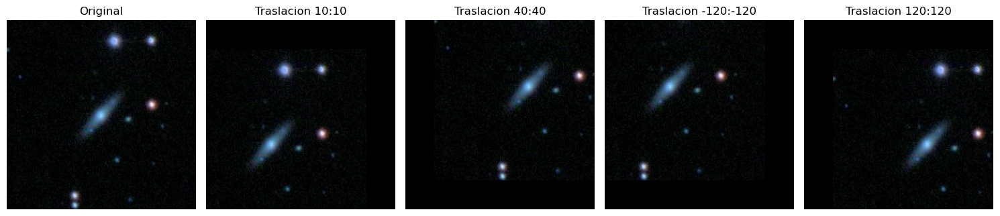

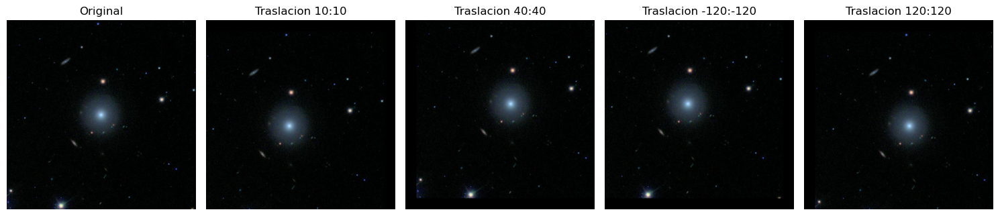

In [226]:
for img in S0s:
    img = cv2.imread(img)

    # Crear la matriz de traslación
    M_traslacion = np.float32 ([[1, 0, -45],
                                 [0, 1, 45]])
    M_traslacion1 =  np.float32([[1, 0, 45],
                                [0, 1, -45]])
    M_traslacion2 = np.float32([[1, 0, -45],
                                [0, 1, -45]])
    M_traslacion3 =  np.float32([[1, 0, 45],
                                 [0, 1, 45]])
    alto, ancho = img.shape[:2]
    # Aplicar la traslación a la imagen
    traslacion = cv2.warpAffine(img, M_traslacion, (ancho, alto))
    traslacion1 = cv2.warpAffine(img, M_traslacion1, (ancho, alto))
    traslacion2 = cv2.warpAffine(img, M_traslacion2, (ancho, alto))
    traslacion3 = cv2.warpAffine(img, M_traslacion3, (ancho, alto))
    
    fig, axs = plt.subplots(1, 5, figsize=(15,40))
    # Mostramos la imagen original en la primera columna
    axs[0].imshow(img)
    axs[0].set_title('Original')
    axs[0].axis('off')
    
    axs[1].imshow(traslacion)
    axs[1].set_title('Traslacion 10:10')
    axs[1].axis('off')
    
    axs[2].imshow(traslacion1)
    axs[2].set_title('Traslacion 40:40')
    axs[2].axis('off')
    
    axs[3].imshow(traslacion2)
    axs[3].set_title('Traslacion -120:-120')
    axs[3].axis('off')
    
    axs[4].imshow(traslacion3)
    axs[4].set_title('Traslacion 120:120')
    axs[4].axis('off')
    
    plt.tight_layout()
    plt.show()

Ruido Gaussiano
-
- La función cv2.add() de OpenCV para agregar ruido a una imagen. La variable img contiene la imagen original, y ruido parece ser la imagen que contiene el ruido que se agregará a img.

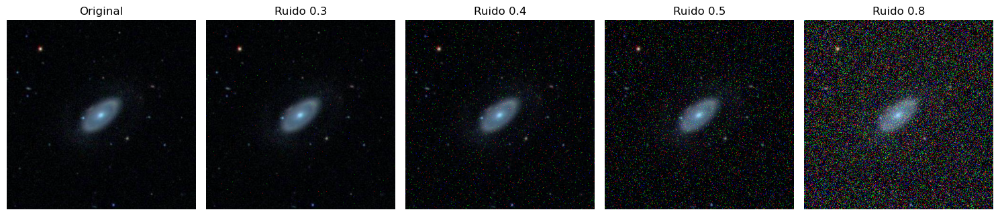

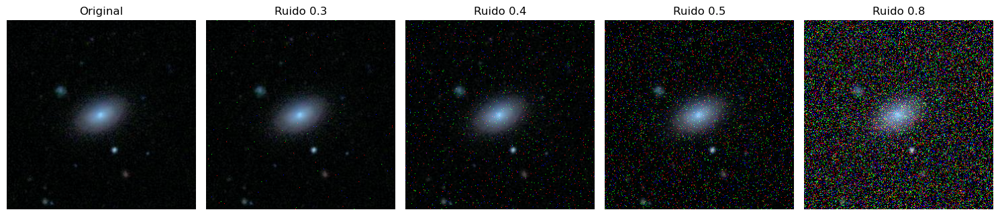

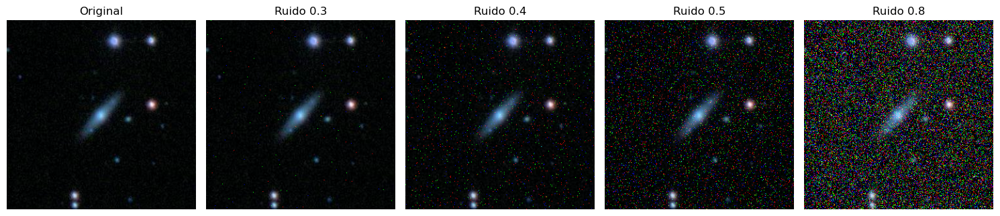

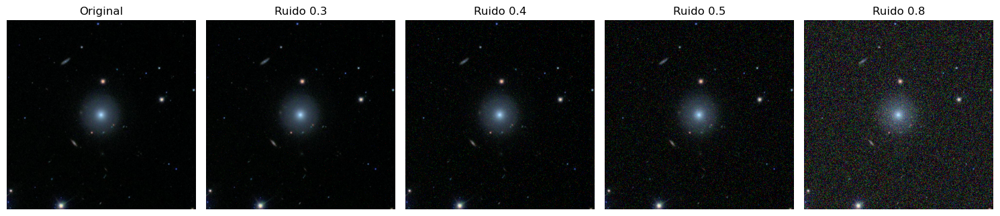

In [227]:
for img in S0s:
    img = cv2.imread(img)

    # Generar ruido
    ruido = np.random.normal(0, 0.3, img.shape).astype(np.uint8)  # ejemplo de ruido gaussiano
    ruido1 = np.random.normal(0, 0.4, img.shape).astype(np.uint8)  # ejemplo de ruido gaussiano
    ruido2 = np.random.normal(0, 0.5, img.shape).astype(np.uint8)  # ejemplo de ruido gaussiano
    ruido3 = np.random.normal(0, 0.8, img.shape).astype(np.uint8)  # ejemplo de ruido gaussiano
    
    # Agregar el ruido a la imagen
    img_noisy = cv2.add(img, ruido)
    img_noisy1 = cv2.add(img, ruido1)
    img_noisy2 = cv2.add(img, ruido2)
    img_noisy3 = cv2.add(img, ruido3)
    
    fig, axs = plt.subplots(1, 5, figsize=(15,40))
    # Mostramos la imagen original en la primera columna
    axs[0].imshow(img)
    axs[0].set_title('Original')
    axs[0].axis('off')
    
    axs[1].imshow(img_noisy)
    axs[1].set_title('Ruido 0.3')
    axs[1].axis('off')
    
    axs[2].imshow(img_noisy1)
    axs[2].set_title('Ruido 0.4')
    axs[2].axis('off')
    
    axs[3].imshow(img_noisy2)
    axs[3].set_title('Ruido 0.5')
    axs[3].axis('off')
    
    axs[4].imshow(img_noisy3)
    axs[4].set_title('Ruido 0.8')
    axs[4].axis('off')
    
    plt.tight_layout()
    plt.show()

Brillo y Contraste
-
- La función cv2.convertScaleAbs() en OpenCV se utiliza para aplicar una transformación lineal a una imagen y luego convertir los resultados a valores absolutos.

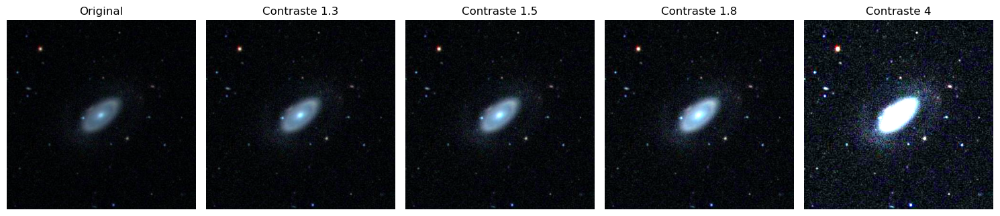

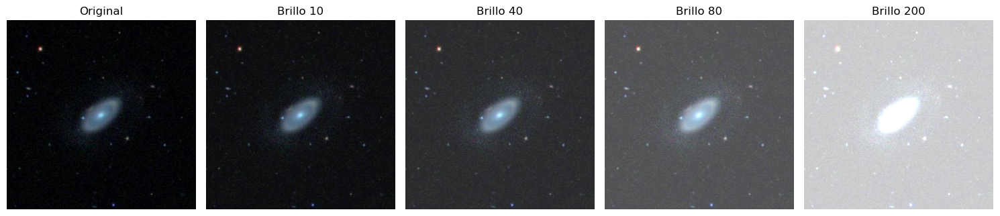

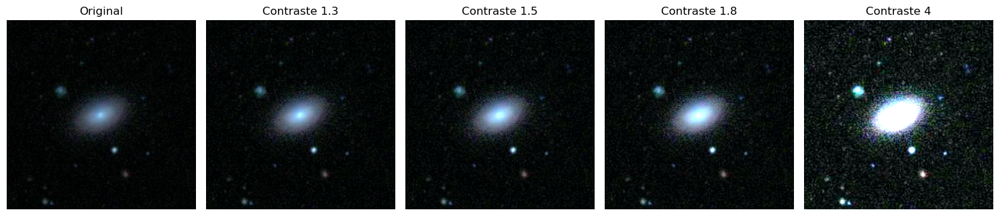

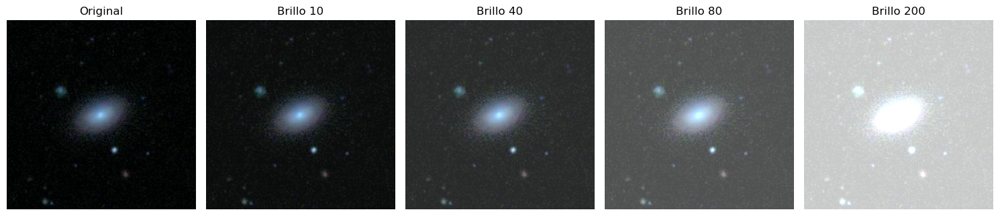

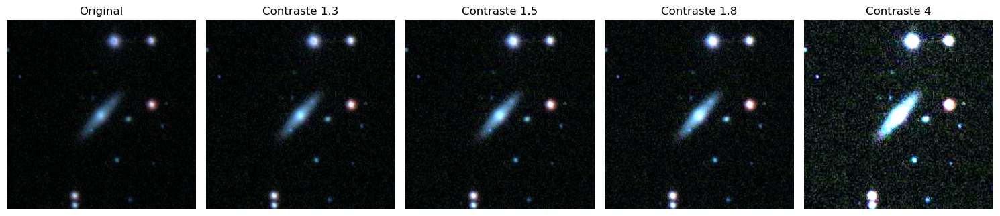

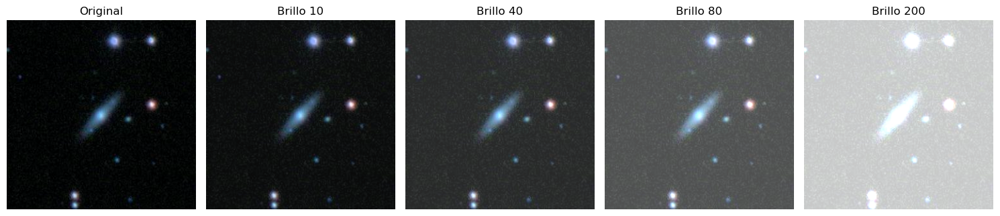

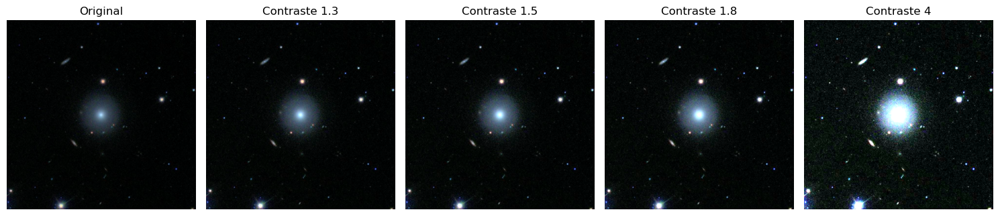

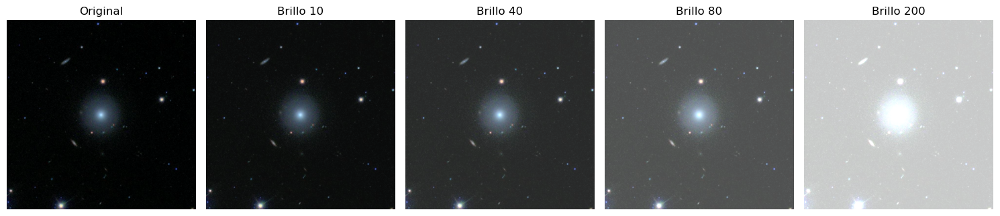

In [228]:
for img in S0s:
    img = cv2.imread(img)
    color_img = cv2.convertScaleAbs(img, alpha=1.3, beta=0)
    color_img1 = cv2.convertScaleAbs(img, alpha=1.5, beta=0)
    color_img2 = cv2.convertScaleAbs(img, alpha=1.8, beta=0)
    color_img3 = cv2.convertScaleAbs(img, alpha=4, beta=0)
    
    fig, axs = plt.subplots(1, 5, figsize=(15,40))
    # Mostramos la imagen original en la primera columna
    axs[0].imshow(img)
    axs[0].set_title('Original')
    axs[0].axis('off')
    
    axs[1].imshow(color_img)
    axs[1].set_title('Contraste 1.3')
    axs[1].axis('off')
    
    axs[2].imshow(color_img1)
    axs[2].set_title('Contraste 1.5')
    axs[2].axis('off')
    
    axs[3].imshow(color_img2)
    axs[3].set_title('Contraste 1.8')
    axs[3].axis('off')
    
    axs[4].imshow(color_img3)
    axs[4].set_title('Contraste 4')
    axs[4].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    
    color_img_ = cv2.convertScaleAbs(img, alpha=1,  beta=10)
    color_img_1 = cv2.convertScaleAbs(img, alpha=1, beta=40)
    color_img_2 = cv2.convertScaleAbs(img, alpha=1, beta=80)
    color_img_3 = cv2.convertScaleAbs(img, alpha=1, beta=200)
    
    fig, axs = plt.subplots(1, 5, figsize=(15,40))
    # Mostramos la imagen original en la primera columna
    axs[0].imshow(img)
    axs[0].set_title('Original')
    axs[0].axis('off')
    
    axs[1].imshow(color_img_)
    axs[1].set_title('Brillo 10')
    axs[1].axis('off')
    
    axs[2].imshow(color_img_1)
    axs[2].set_title('Brillo 40')
    axs[2].axis('off')
    
    axs[3].imshow(color_img_2)
    axs[3].set_title('Brillo 80')
    axs[3].axis('off')
    
    axs[4].imshow(color_img_3)
    axs[4].set_title('Brillo 200')
    axs[4].axis('off')
    
    plt.tight_layout()
    plt.show()